# Exploratory Data Analysis - Processed Data

---

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Exploratory-Data-Analysis---Processed-Data" data-toc-modified-id="Exploratory-Data-Analysis---Processed-Data-1">Exploratory Data Analysis - Processed Data</a></span></li></ul></div>

In [219]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [220]:
import glob
import geopandas as gpd
import pandas as pd
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
from shapely import wkt
import datetime as dt

In [221]:
from tools.tools import read_json, get_current_time
from capstone.etl.viirs_join_basins import viirs_join_basins, compile_basin_data
from capstone.etl.census_parse import parse_census
from capstone.etl.census_retrieval import census_retrieval
from capstone.etl.generate_basins import generate_us_basins
from capstone.etl.eia_retrieval import eia_retrieval
from capstone.etl.eia_parse import eia_parse_county, eia_parse_data

In [222]:
config = read_json('../config.json')

current_date = get_current_time('yyyymmdd')

wd = f"{config['workspace_directory']}/data"

In [223]:
plt.style.use('ggplot')

In [224]:
basin_colors_hex = {  # manually defined dictionary of EIA basin-level standardized colors 
    "Anadarko Region":    "#2BA2CF", 
    "Appalachia Region":  "#769F5D",
    "Bakken Region":      "#F6C432", 
    "Eagle Ford Region":  "#48366B", 
    "Haynesville Region": "#807B8F",
    "Niobrara Region":    "#9D3341",
    "Permian Region":     "#6F4B27",
}

# Exploratory Data Analysis - Processed Data


In [247]:
census_shp = census_retrieval(f"{wd}/input/census")
census = gpd.read_file(census_shp)
census.columns = [c.lower() for c in census.columns]

eia_xls = eia_retrieval(f"{wd}/input/eia")
eia_cnty = eia_parse_county(eia_xls)
eia_data = eia_parse_data(eia_xls)  # parse the target variable(s) data

census_gdf = parse_census(census_shp)
basins_list, all_basins = generate_us_basins(
    census_gdf,
    eia_cnty,
    f"{wd}/input/basins",
)  # this code creates individual files for basin geographies as well as an all_basins geography file/object.

 parse eia data
    for Anadarko Region
    for Appalachia Region
    for Bakken Region
    for Eagle Ford Region
    for Haynesville Region
    for Niobrara Region
    for Permian Region
generating us basins
    permian region
    appalachia region
    haynesville region
    eagle ford region
    anadarko region
    niobrara region
    bakken region


In [225]:
basins_int_viirs_21c = pd.read_csv(  # temporary intermediate file read for working on MacBook rather than iMac
    f"{wd}/processing/basins_int_viirs_21c.csv",
    dtype={'geoid': object},
)
basins_int_viirs_30  = pd.read_csv(
    f"{wd}/processing/basins_int_viirs_30.csv",
    dtype={'geoid': object},
)

In [226]:
print(basins_int_viirs_21c.shape)
print(basins_int_viirs_30.shape)

(427798, 129)
(523075, 46)


In [227]:
basins_int_viirs_21c.head(3)

,aland,area_bb,area_pixel,awater,cbsafp,ch_m12,ch_m13,classfp,cloud_mask,co2_eq,...,thr_m16,tran_dnb,tran_m07,tran_m08,tran_m10,tran_m12,tran_m13,tran_m14,tran_m15,tran_m16
0,4727469721,NaN,NaN,301107657,NaN,0.000000;0.062081;0.086345;0.112419;0.157635;0...,0.000000;0.074897;0.106120;0.150975;0.234767;0...,H1,0.0,NaN,...,6.84127,1,1,1,1,1,1,1,1,1
1,4727469721,NaN,NaN,301107657,NaN,0.000000;0.062081;0.086345;0.112419;0.157635;0...,0.000000;0.074897;0.106120;0.150975;0.234767;0...,H1,0.0,NaN,...,6.84127,1,1,1,1,1,1,1,1,1
2,4727469721,NaN,NaN,301107657,NaN,0.000000;0.062081;0.086345;0.112419;0.157635;0...,0.000000;0.074897;0.106120;0.150975;0.234767;0...,H1,0.0,NaN,...,6.84127,1,1,1,1,1,1,1,1,1


In [228]:
basins_int_viirs_30.head(3)

,aland,area_bb,area_pixel,awater,cbsafp,classfp,cloud_mask,co2_eq,countyfp,countyns,...,qf_fit,region,rh,rhi,sample_dnb,sample_m10,source_id,statefp,temp_bb,temp_bkg
0,5381129960,NaN,NaN,182522236,48780.0,H1,3.0,NaN,105,1035306,...,0.0,Bakken Region,NaN,NaN,1523.0,1142.0,NaN,38,NaN,NaN
1,5381129960,1.1615,0.811394,182522236,48780.0,H1,3.0,NaN,105,1035306,...,1.0,Bakken Region,0.792865,0.977164,1522.0,1142.0,NaN,38,1863.0,NaN
2,5381129960,NaN,NaN,182522236,48780.0,H1,3.0,NaN,105,1035306,...,0.0,Bakken Region,NaN,NaN,1553.0,1166.0,NaN,38,NaN,NaN


In [229]:
common_cols = list(basins_int_viirs_21c.columns & basins_int_viirs_30.columns)  
# generate list of common columns for intersected viirs version 2.1c and 3.0 

In [ ]:
basins_int_viirs_21c = basins_int_viirs_21c[common_cols]
basins_int_viirs_30 = basins_int_viirs_30[common_cols]
# unify the dataframes for 2.1c and 3.0 intersected viirs

In [ ]:
df = pd.concat([basins_int_viirs_21c, basins_int_viirs_30], sort=True)  
# combine 2.1c and 3.0 int viirs

In [231]:
df.shape  # check shape of the data. 

(1532076, 14)

In [232]:
df['date_mscan'].head(3)  # sanity check to see first dates from 2.1c are here.

0    2012/03/01 10:10:41.916
1    2012/03/01 10:10:41.916
2    2012/03/01 10:10:43.695
Name: date_mscan, dtype: object

In [235]:
df['date_mscan'].tail(3)  # sanity check to see latest dates from 3.0 are here.

523072    2020/03/03 09:47:09.406
523073    2020/03/03 08:07:20.386
523074    2020/03/03 09:47:37.874
Name: date_mscan, dtype: object

In [236]:
df['region'].unique()  # sanity check, regions, sup. 

array(['Bakken Region', 'Niobrara Region', 'Anadarko Region',
       'Haynesville Region', 'Permian Region', 'Eagle Ford Region',
       'Appalachia Region'], dtype=object)

## Explore Missing Data in Post-Geoprocessed Nightfire spatially joined with Basin data. 

The Nightfire datasets have known missing values in some of the metrics and some columns that are completely incomplete, for example those that refer to CO2 and Methane detection via the multispectral bands. This is expeceted. These and other missing data will be dropped. Mostly the aim will be to leverage and generate descriptive statistics about the counts per units of time as well as the temperature related variables. 

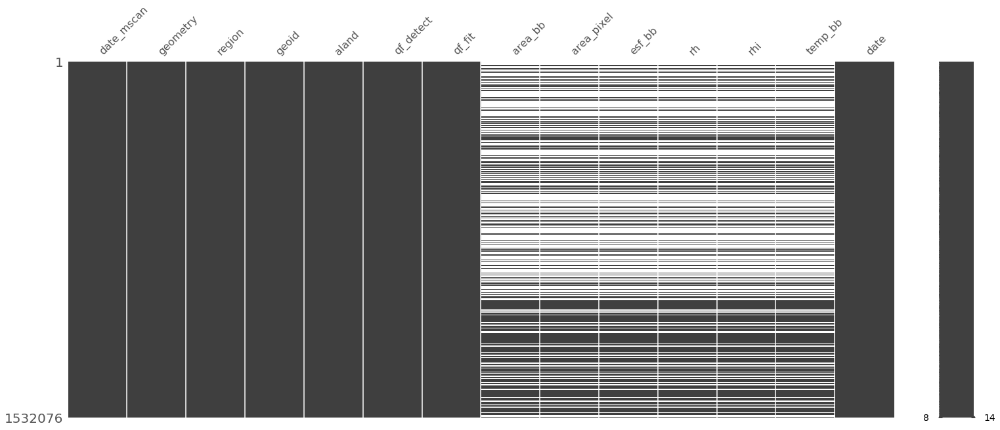

In [238]:
msno.matrix(df);  # showing NaN data.

In [239]:
df.isnull().sum()  # which columns have nulls

date_mscan         0
geometry           0
region             0
geoid              0
aland              0
qf_detect          0
qf_fit             0
area_bb       804917
area_pixel    804917
esf_bb        804917
rh            804917
rhi           804917
temp_bb       804917
date               0
dtype: int64

In [203]:
# drop very incomplete columns and unnecessary census county columns. 
df = df.drop(
    columns=[
        'metdivfp',  # drop these b/c majority missing, not useful
        'methane_eq',
        'temp_bkg',
        'csafp',
        'co2_eq',  # drop these b/c majority missing, not useful
        'file_dnb',  # more viirs to drop
        'file_m10',
        'id', 
        'id_key',
        'line_dnb',
        'line_m10',
        'sample_dnb',
        'sample_m10',
        'cloud_mask',
        'date_proc',  # don't need processed date, use date_mscan
        'lat_gmtco',  # viirs lat
        'lon_gmtco',  # viirs lon
        'statefp',  # census variables not useful
        'countyfp',
        'countyns',
        'name',
        'namelsad',
        'lsad',
        'classfp',
        'mtfcc',
        'cbsafp',
        'intptlat',
        'intptlon',
        'awater',
        'funcstat',  # census variables not useful
        'index_right',  # not useful but maybe check where this came from 
    ],
)
df.isnull().sum()  # nulls after dropping columns, this is expected

aland              0
area_bb       804917
area_pixel    804917
ch_m12        523075
ch_m13        523075
               ...  
tran_m12      523075
tran_m13      523075
tran_m14      523075
tran_m15      523075
tran_m16      523075
Length: 100, dtype: int64

In [240]:
# reorder the variables manually 
df = df[[
    'date_mscan',
    'geometry',
    'region',
    'geoid',
    'aland',
    'qf_detect',
    'qf_fit',
    'area_bb',
    'area_pixel',
    'esf_bb',
    'rh',
    'rhi',
    'temp_bb',
]]

In [241]:
df_complete_rows = df.dropna()

In [242]:
df_complete_rows.shape  
# this is data that will be set aside and used if temperature and other data is leveraged

(727159, 13)

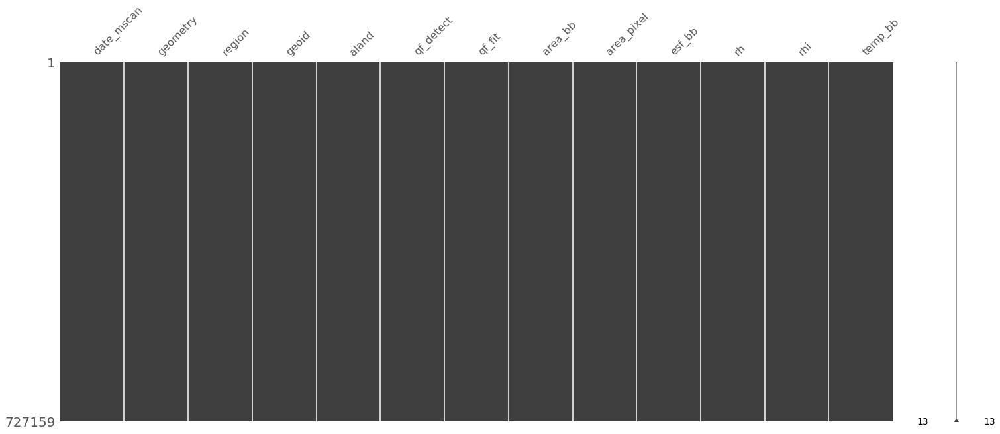

In [243]:
msno.matrix(df_complete_rows);  # showing completely filled data observations

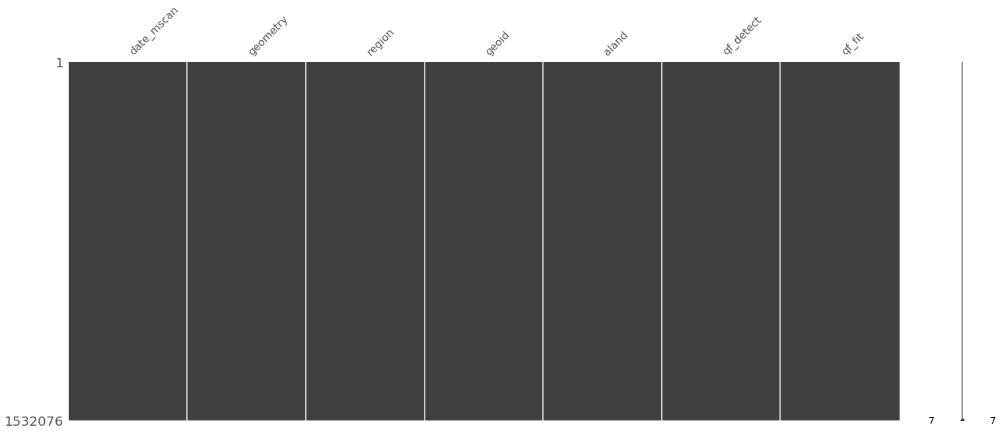

In [244]:
df = df.dropna(axis=1, how='any')
msno.matrix(df);  # df, now only has columns that are complete. 

In [245]:
df['date'] = pd.to_datetime(df['date_mscan']).dt.date

df_for_agg = df[['date', 'region', 'geoid', 'qf_detect', 'qf_fit']]
df_for_agg['geoid'].dtypes

dtype('O')

In [248]:
census_gdf['geoid'].dtypes  # check data type for geoid, make sure object

dtype('O')

In [249]:
df_for_agg

,date,region,geoid,qf_detect,qf_fit
0,2012-03-01,Bakken Region,38061,2049.0,0.0
1,2012-03-01,Bakken Region,38061,2371.0,0.0
2,2012-03-01,Bakken Region,38061,2177.0,0.0
3,2012-03-01,Bakken Region,38061,2499.0,0.0
4,2012-03-01,Bakken Region,38061,2433.0,0.0
...,...,...,...,...,...
523070,2020-03-03,Niobrara Region,56009,442177.0,1.0
523071,2020-03-03,Niobrara Region,56009,3905.0,0.0
523072,2020-03-03,Niobrara Region,56009,2881.0,0.0
523073,2020-03-03,Niobrara Region,8123,376643.0,1.0


In [250]:
df_for_agg['count'] = 1

df_day_agg = df_for_agg.groupby(
    ["date", "region"],
).agg(
    obs_day_cnt=pd.NamedAgg(column='count', aggfunc='sum'),
    qf_detect_day_avg=pd.NamedAgg(column='qf_detect', aggfunc='mean'),
    qf_detect_day_med=pd.NamedAgg(column='qf_detect', aggfunc='median'),
    qf_detect_day_sum=pd.NamedAgg(column='qf_detect', aggfunc='sum'),
    qf_detect_day_min=pd.NamedAgg(column='qf_detect', aggfunc='min'),
    qf_detect_day_max=pd.NamedAgg(column='qf_detect', aggfunc='max'),
    qf_fit_day_avg=pd.NamedAgg(column='qf_fit', aggfunc='mean'),
    qf_fit_day_med=pd.NamedAgg(column='qf_fit', aggfunc='median'),
    qf_fit_day_sum=pd.NamedAgg(column='qf_fit', aggfunc='sum'),
    qf_fit_day_min=pd.NamedAgg(column='qf_fit', aggfunc='min'),
    qf_fit_day_max=pd.NamedAgg(column='qf_fit', aggfunc='max'),
).reset_index().copy()

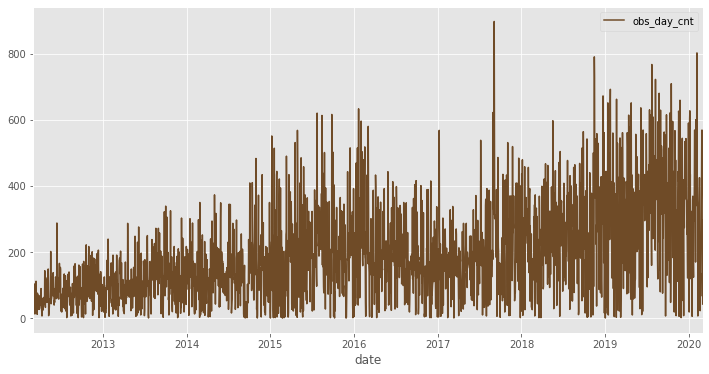

In [251]:
region = 'Permian Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['obs_day_cnt']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);

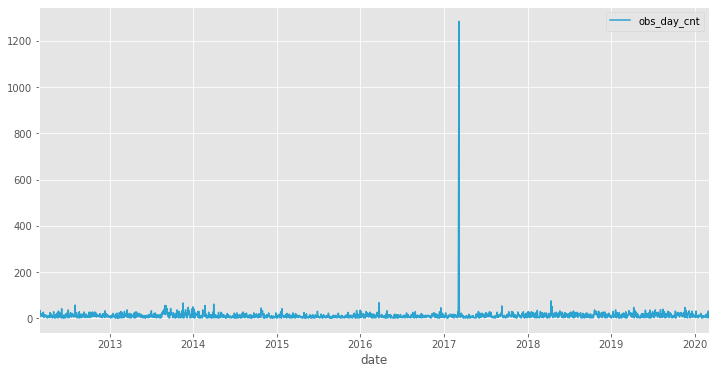

In [252]:
region = 'Anadarko Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['obs_day_cnt']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);  # seems to be some weird event in Anadarko Region 

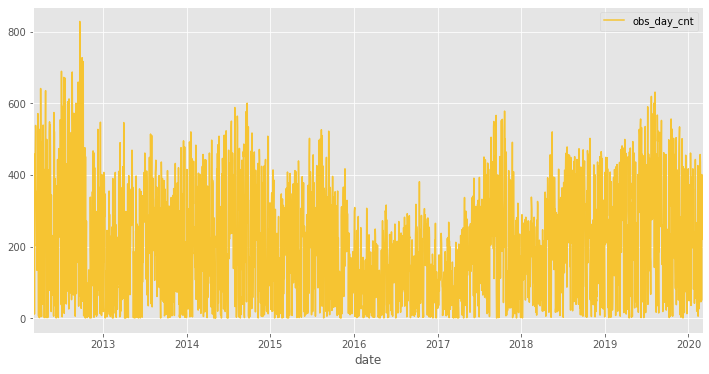

In [253]:
region = 'Bakken Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['obs_day_cnt']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);

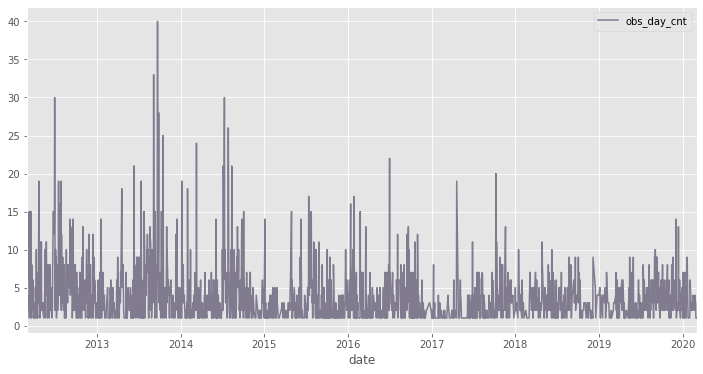

In [254]:
region = 'Haynesville Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['obs_day_cnt']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);

### Keep `obs_day_cnt`, looks reliable.  

Anadarko region has something strange, but there is a large fire in 2017. Unclear at this point whether to drop. 

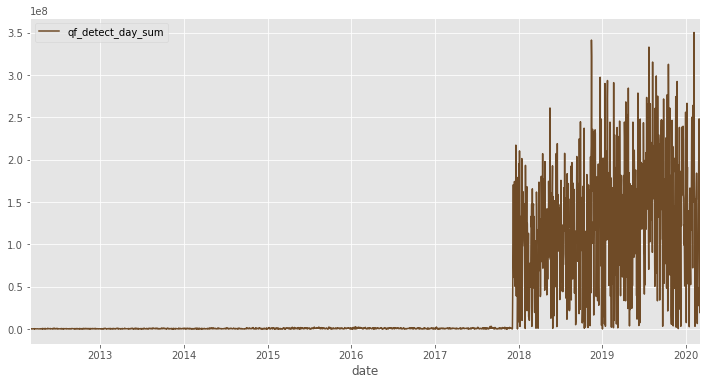

In [256]:
region = 'Permian Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_detect_day_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);

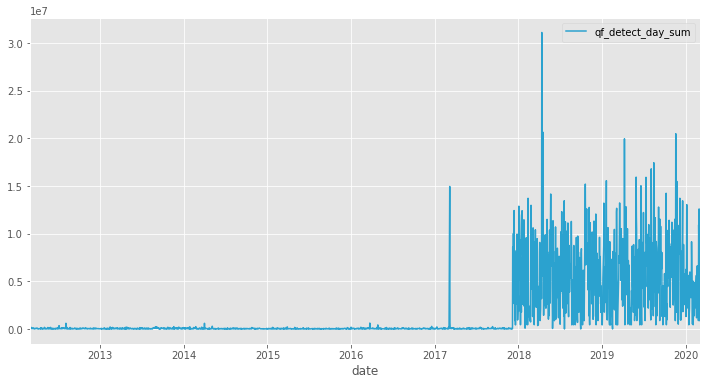

In [257]:
region = 'Anadarko Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_detect_day_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);

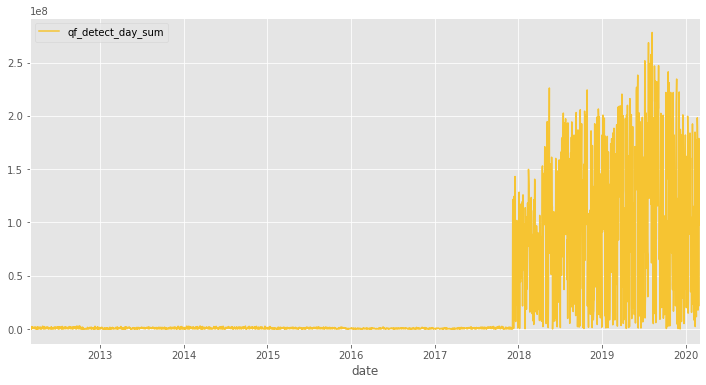

In [258]:
region = 'Bakken Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_detect_day_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);

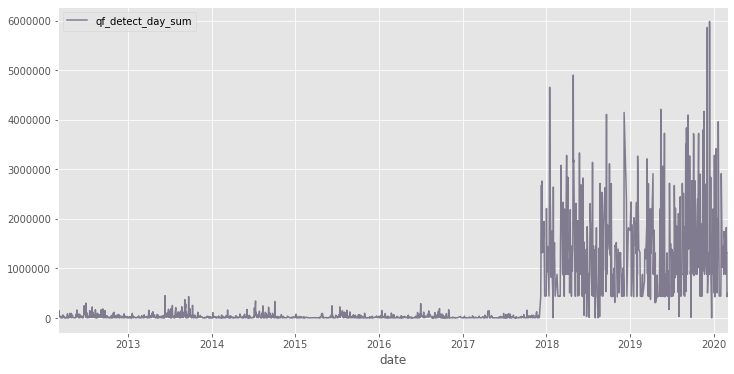

In [259]:
region = 'Haynesville Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_detect_day_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);

### Drop `qf_detect` 
From the plots above, I can summize that `qf_detect` variables are systematically different from v2.1c to 3.0.

In [260]:
df_day_agg.drop(
    columns=[
        'qf_detect_day_avg',
        'qf_detect_day_med',
        'qf_detect_day_sum',
        'qf_detect_day_min',
        'qf_detect_day_max',
    ],
    inplace=True
)

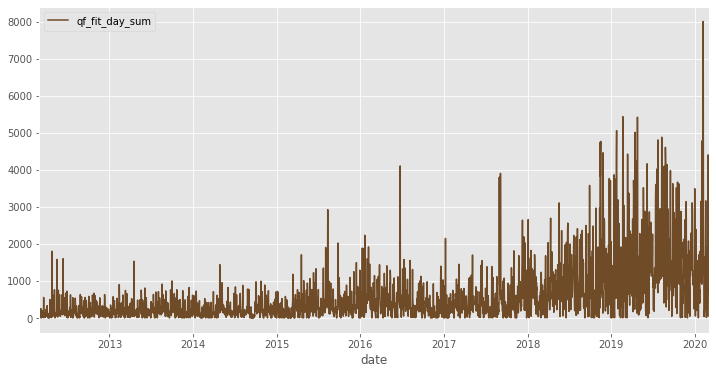

In [261]:
region = 'Permian Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_fit_day_sum']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);

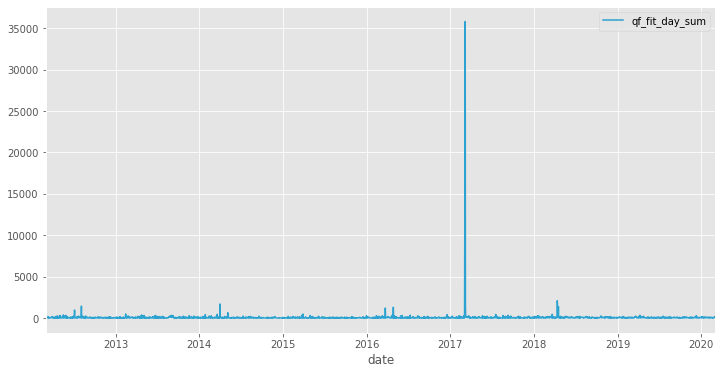

In [262]:
region = 'Anadarko Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_fit_day_sum']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);  # weird noise, but perhaps acceptable

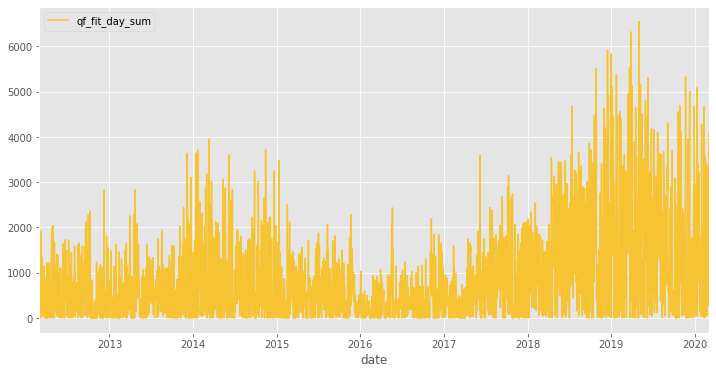

In [263]:
region = 'Bakken Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_fit_day_sum']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);

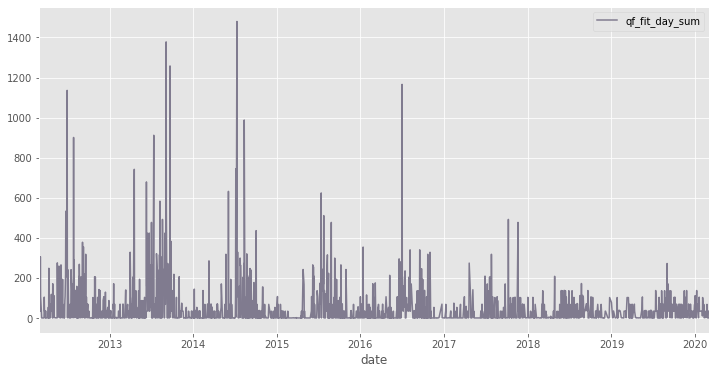

In [264]:
region = 'Haynesville Region'
df_day_agg[
    df_day_agg['region'] == region
].set_index('date')[['qf_fit_day_sum']].plot(
    figsize=(12, 6), 
    c=basin_colors_hex[region],
);

# Keep `qf_fit`
The `qf_fit` variable doesn't seem to have the systematic error as `qf_detect`. 


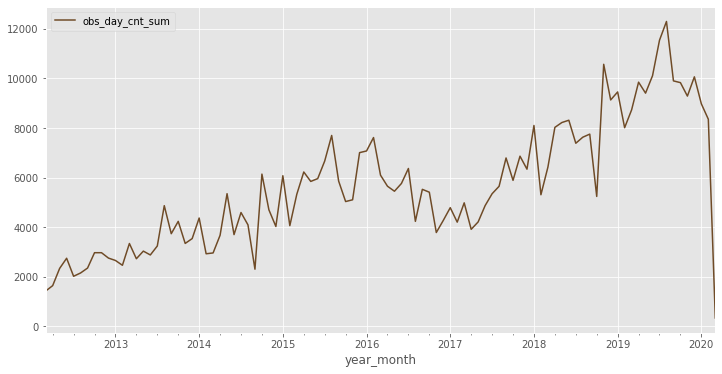

In [267]:
region = 'Permian Region'
df_month_agg[
    df_month_agg['region'] == region
].set_index('year_month')[['obs_day_cnt_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);  # expected dropoff, march is not complete for sum

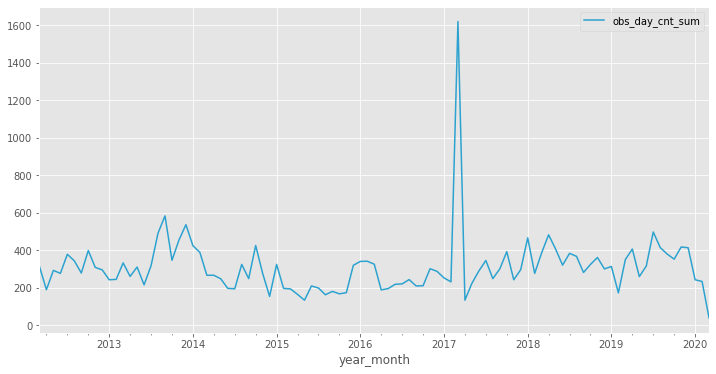

In [268]:
region = 'Anadarko Region'
df_month_agg[
    df_month_agg['region'] == region
].set_index('year_month')[['obs_day_cnt_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);  # expected dropoff, march is not complete for sum

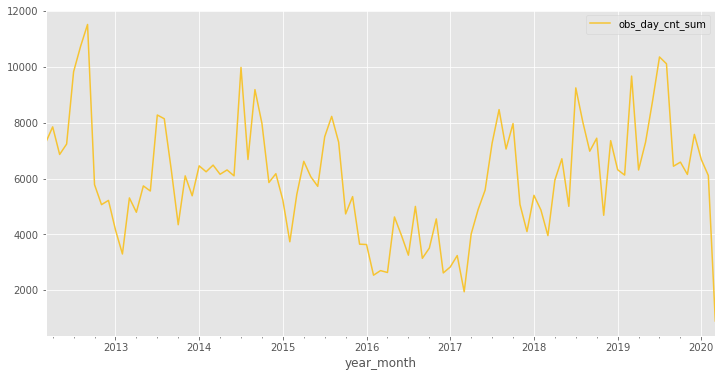

In [269]:
region = 'Bakken Region'
df_month_agg[
    df_month_agg['region'] == region
].set_index('year_month')[['obs_day_cnt_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);  # expected dropoff, march is not complete for sum

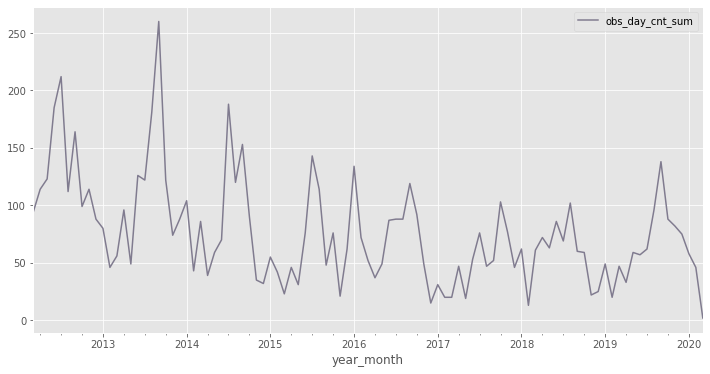

In [270]:
region = 'Haynesville Region'
df_month_agg[
    df_month_agg['region'] == region
].set_index('year_month')[['obs_day_cnt_sum']].plot(
    figsize=(12, 6),
    c=basin_colors_hex[region],
);  # expected dropoff, march is not complete for sum

In [271]:
df_month_agg.shape

(679, 32)

In [272]:
df_month_agg.shape[0] / 7. 
# number of months of data for each of the seven regions. 

97.0

In [273]:
all_basins[['region', 'geoid', 'aland']].head(6)
# next, create variable of total land area in square meters for basin
# geoid's are unique counties and aland is their land area

,region,geoid,aland
0,Permian Region,48327,2336237920
1,Permian Region,48189,2602109431
2,Appalachia Region,42007,1125901161
3,Appalachia Region,54075,2435322222
4,Haynesville Region,22111,2271359845
5,Appalachia Region,36101,3601504767


In [274]:
basin_area = all_basins[['region', 'aland']].groupby(
    ['region'],
    as_index=False,
).sum()

basin_area

,region,aland
0,Anadarko Region,75463801085
1,Appalachia Region,192181893591
2,Bakken Region,91261078507
3,Eagle Ford Region,64571223163
4,Haynesville Region,48802443064
5,Niobrara Region,232124086468
6,Permian Region,211875565064


In [275]:
df_month_agg = df_month_agg.merge(basin_area, on='region', how='left')

In [276]:
df_month_agg[['year_month', 'region', 'obs_day_cnt_sum', 'aland']]
# looks good. 

,year_month,region,obs_day_cnt_sum,aland
0,2012-03-01,Anadarko Region,313,75463801085
1,2012-03-01,Appalachia Region,870,192181893591
2,2012-03-01,Bakken Region,7289,91261078507
3,2012-03-01,Eagle Ford Region,1262,64571223163
4,2012-03-01,Haynesville Region,94,48802443064
...,...,...,...,...
674,2020-03-01,Bakken Region,900,91261078507
675,2020-03-01,Eagle Ford Region,59,64571223163
676,2020-03-01,Haynesville Region,2,48802443064
677,2020-03-01,Niobrara Region,32,232124086468


In [277]:
for i in df_month_agg.columns:
    if (i != 'year_month') & (i != 'region') & (i != 'aland'):
        df_month_agg[f'{i}_per_squaremeters'] = df_month_agg[i] / df_month_agg['aland']

In [279]:
df_modeling = pd.merge(
    df_month_agg,
    eia_data[['month', 'region', 'oil_bbl_d_total_production']],
    left_on=['year_month', 'region'],
    right_on=['month', 'region'],
)

In [280]:
df_modeling.to_csv(f"{wd}/processing/basin_int_viirs_for_modeling.csv", index=False)

In [265]:
df_day_agg['year_month'] = pd.to_datetime(
    df_day_agg['date'].apply(lambda x: x.strftime('%Y-%m'))
)  # create year_month column

df_day_agg

,date,region,obs_day_cnt,qf_fit_day_avg,qf_fit_day_med,qf_fit_day_sum,qf_fit_day_min,qf_fit_day_max,year_month
0,2012-03-01,Anadarko Region,10,3.700000,0.0,37.0,0.0,34.0,2012-03-01
1,2012-03-01,Appalachia Region,7,14.714286,1.0,103.0,0.0,34.0,2012-03-01
2,2012-03-01,Bakken Region,205,2.365854,0.0,485.0,0.0,34.0,2012-03-01
3,2012-03-01,Eagle Ford Region,31,0.322581,0.0,10.0,0.0,1.0,2012-03-01
4,2012-03-01,Haynesville Region,1,34.000000,34.0,34.0,34.0,34.0,2012-03-01
...,...,...,...,...,...,...,...,...,...
18407,2020-03-02,Permian Region,43,1.209302,0.0,52.0,0.0,34.0,2020-03-01
18408,2020-03-03,Anadarko Region,2,17.500000,17.5,35.0,1.0,34.0,2020-03-01
18409,2020-03-03,Bakken Region,371,10.956873,1.0,4065.0,0.0,34.0,2020-03-01
18410,2020-03-03,Eagle Ford Region,3,0.666667,1.0,2.0,0.0,1.0,2020-03-01


In [266]:
df_month_agg = df_day_agg.groupby(
    ["year_month", "region"],
).agg(
    obs_day_cnt_avg=pd.NamedAgg(column='obs_day_cnt', aggfunc='mean'),
    obs_day_cnt_med=pd.NamedAgg(column='obs_day_cnt', aggfunc='median'),
    obs_day_cnt_sum=pd.NamedAgg(column='obs_day_cnt', aggfunc='sum'),
    obs_day_cnt_min=pd.NamedAgg(column='obs_day_cnt', aggfunc='min'),
    obs_day_cnt_max=pd.NamedAgg(column='obs_day_cnt', aggfunc='max'),
    
    qf_fit_day_avg_avg=pd.NamedAgg(column='qf_fit_day_avg', aggfunc='mean'),
    qf_fit_day_avg_med=pd.NamedAgg(column='qf_fit_day_avg', aggfunc='median'),
    qf_fit_day_avg_sum=pd.NamedAgg(column='qf_fit_day_avg', aggfunc='sum'),
    qf_fit_day_avg_min=pd.NamedAgg(column='qf_fit_day_avg', aggfunc='min'),
    qf_fit_day_avg_max=pd.NamedAgg(column='qf_fit_day_avg', aggfunc='max'),

    qf_fit_day_med_avg=pd.NamedAgg(column='qf_fit_day_med', aggfunc='mean'),
    qf_fit_day_med_med=pd.NamedAgg(column='qf_fit_day_med', aggfunc='median'),
    qf_fit_day_med_sum=pd.NamedAgg(column='qf_fit_day_med', aggfunc='sum'),
    qf_fit_day_med_min=pd.NamedAgg(column='qf_fit_day_med', aggfunc='min'),
    qf_fit_day_med_max=pd.NamedAgg(column='qf_fit_day_med', aggfunc='max'),
    
    qf_fit_day_sum_avg=pd.NamedAgg(column='qf_fit_day_sum', aggfunc='mean'),
    qf_fit_day_sum_med=pd.NamedAgg(column='qf_fit_day_sum', aggfunc='median'),
    qf_fit_day_sum_sum=pd.NamedAgg(column='qf_fit_day_sum', aggfunc='sum'),
    qf_fit_day_sum_min=pd.NamedAgg(column='qf_fit_day_sum', aggfunc='min'),
    qf_fit_day_sum_max=pd.NamedAgg(column='qf_fit_day_sum', aggfunc='max'),
  
    qf_fit_day_min_avg=pd.NamedAgg(column='qf_fit_day_min', aggfunc='mean'),
    qf_fit_day_min_med=pd.NamedAgg(column='qf_fit_day_min', aggfunc='median'),
    qf_fit_day_min_sum=pd.NamedAgg(column='qf_fit_day_min', aggfunc='sum'),
    qf_fit_day_min_min=pd.NamedAgg(column='qf_fit_day_min', aggfunc='min'),
    qf_fit_day_min_max=pd.NamedAgg(column='qf_fit_day_min', aggfunc='max'),
       
    qf_fit_day_max_avg=pd.NamedAgg(column='qf_fit_day_max', aggfunc='mean'),
    qf_fit_day_max_med=pd.NamedAgg(column='qf_fit_day_max', aggfunc='median'),
    qf_fit_day_max_sum=pd.NamedAgg(column='qf_fit_day_max', aggfunc='sum'),
    qf_fit_day_max_min=pd.NamedAgg(column='qf_fit_day_max', aggfunc='min'),
    qf_fit_day_max_max=pd.NamedAgg(column='qf_fit_day_max', aggfunc='max'),
).reset_index()

In [205]:
df['date'] = pd.to_datetime(df['date_mscan']).dt.date

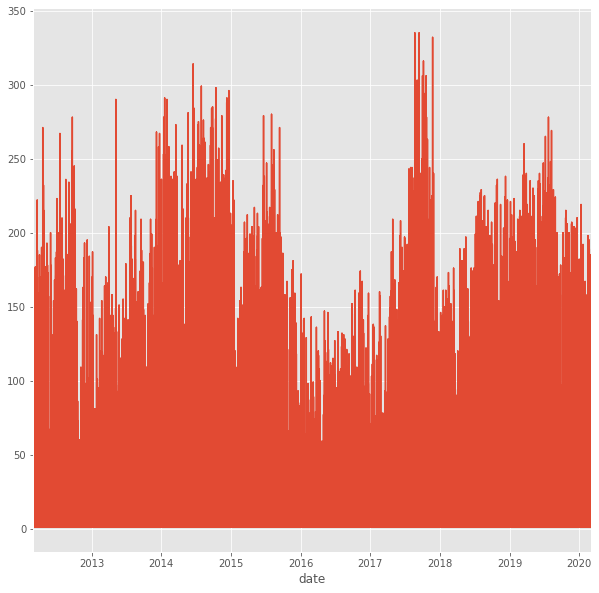

In [206]:
df[df['region'] == 'Bakken Region'].groupby(['date', 'geoid'], as_index=False).count().set_index('date')['qf_fit'].plot(figsize=(10, 10))

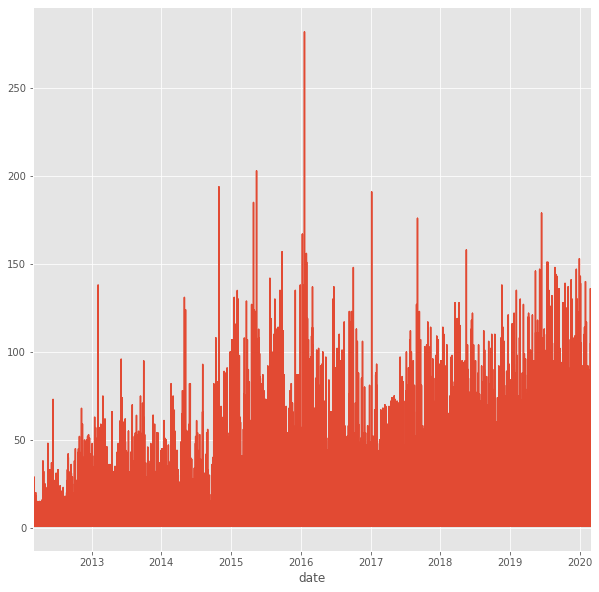

In [207]:
df[df['region'] == 'Permian Region'].groupby(['date', 'geoid'], as_index=False).count().set_index('date')['qf_fit'].plot(figsize=(10, 10))

In [208]:
#dfi = df.copy() 
#dfi = dfi[(df.index < '2015-1-1')]
dfi = df.copy()
print(dfi.shape)

dfi = dfi[dfi['date'].between(dt.date(2017,1,1), dt.date(2017,12,31), inclusive=True)]
dfi = dfi.set_index('date')
print(dfi.shape)

dfi = dfi[dfi['region'] == 'Bakken Region']
print(dfi.shape)

(1532076, 14)
(164209, 13)
(62465, 13)


In [209]:
dfi['geometry'] = dfi['geometry'].apply(wkt.loads)
dfig = gpd.GeoDataFrame(dfi, geometry = 'geometry')
dfig.crs = {'init' :'epsg:4326'}

In [210]:
# dfig.plot(figsize=(12, 10));

In [211]:
# dfi.index

In [212]:
# for i in dfi.index.unique:
#     print(i)

In [213]:
x = dfi.index.unique()

In [214]:
# for i in x:
#     print(i)
import contextily
#

In [215]:
import warnings
warnings.filterwarnings("ignore")

In [216]:
basin_gdf = gpd.read_file(f"{wd}/input/basins/bakken_region.shp")
counties_gdf = gpd.read_file(f"{wd}/input/basins/bakken_region_counties_select.shp")

dfig = dfig.to_crs(epsg=3857)
basin_gdf = basin_gdf.to_crs(epsg=3857)
counties_gdf = counties_gdf.to_crs(epsg=3857)

In [217]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import imageio

def plot_time_geo_df(geo_df, background_df, counties, select_time):
    # inspired by https://ndres.me/post/matplotlib-animated-gifs-easily/
    
    fig, ax = plt.subplots(1, 1, figsize=(10, 7))
    geo_df_sel = geo_df[geo_df.index == select_time]

    ax.set_facecolor('lightgrey')
    
    background_df.plot(
        ax=ax, 
        label='Bakken Region',
        legend=True,
        color=basin_colors_hex['Bakken Region'], 
        edgecolor='white', 
        linewidth=0.2, 
    ) 
    
    counties.geometry.boundary.plot(
        ax=ax,
        color=None, 
        edgecolor='white', 
        linewidth=0.3,
    )
    
    minx, miny, maxx, maxy = background_df.geometry.total_bounds
    geo_df_sel.plot(ax=ax, color='red', edgecolor='black', legend=True)
    
    ax.set_xlim(minx, maxx) 
    ax.set_ylim(miny, maxy)
    ax.xaxis.set_ticklabels([])
    ax.yaxis.set_ticklabels([])
    ax.set_title(f'Bakken Region Nightfire (VIIRS) - {select_time}')

    plt.grid(b=None)  # get rid of grid in background if ggplot

    fig.tight_layout()
    fig.canvas.draw()      
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

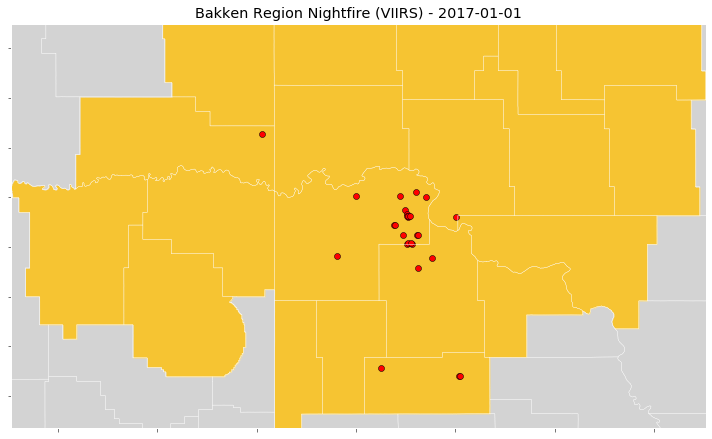

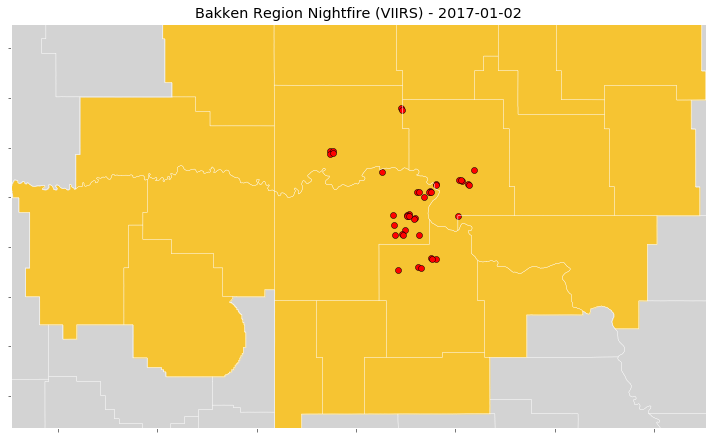

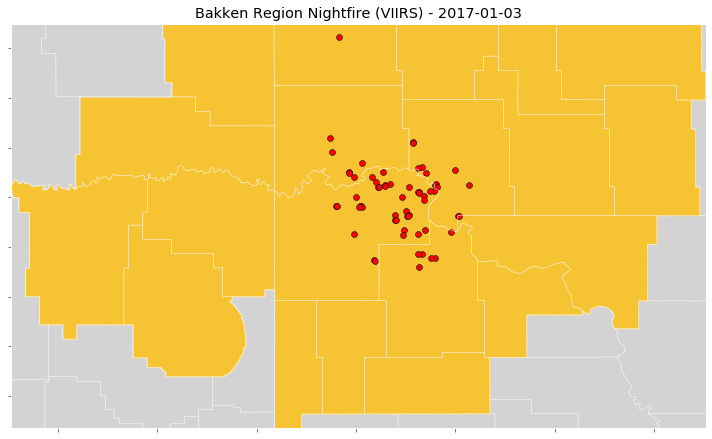

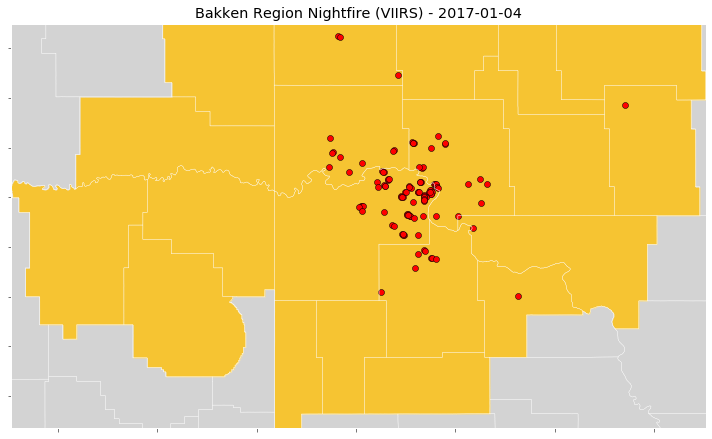

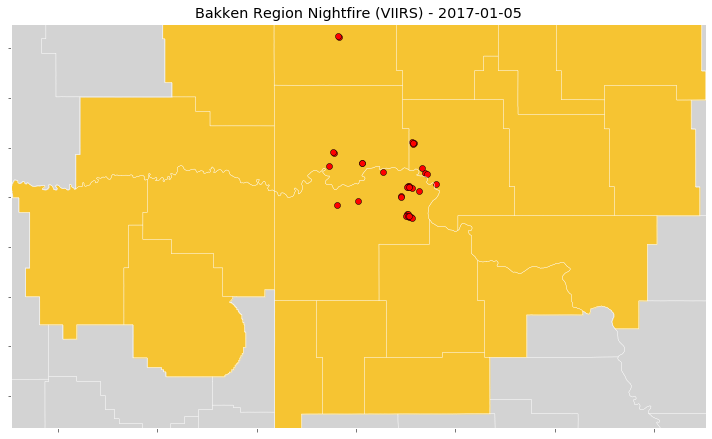

...

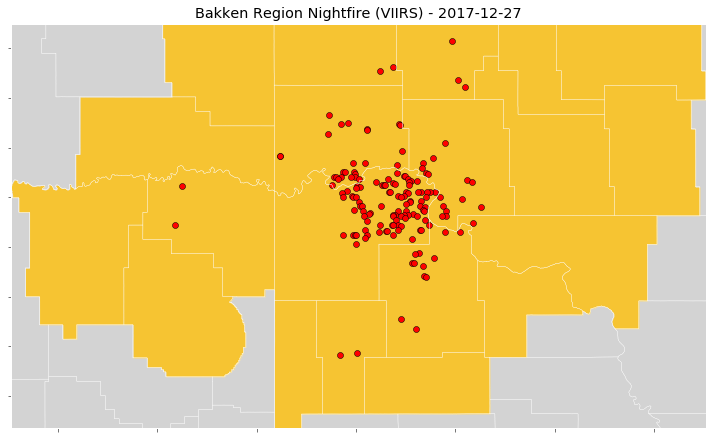

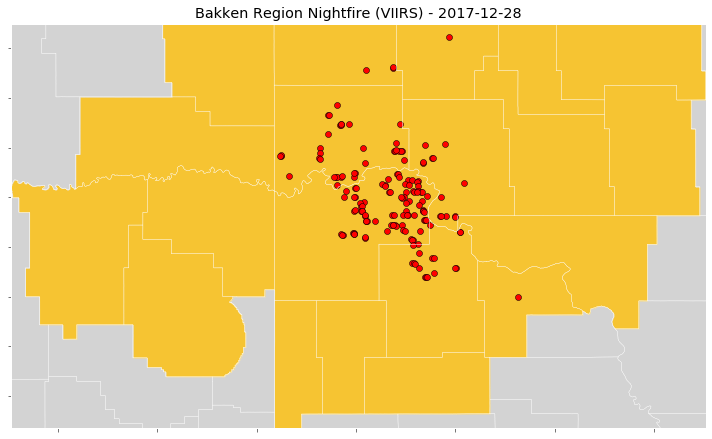

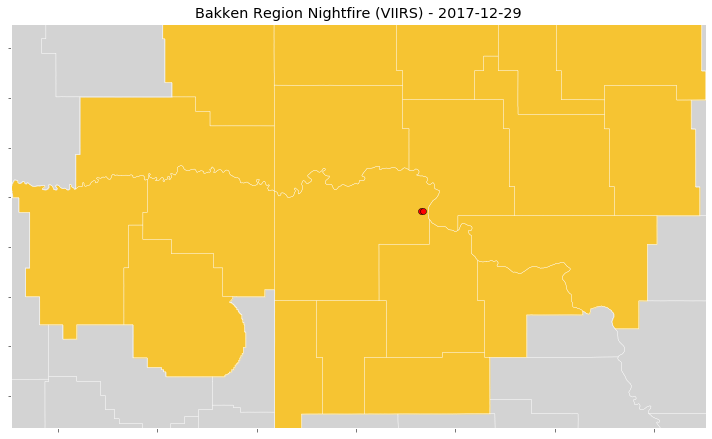

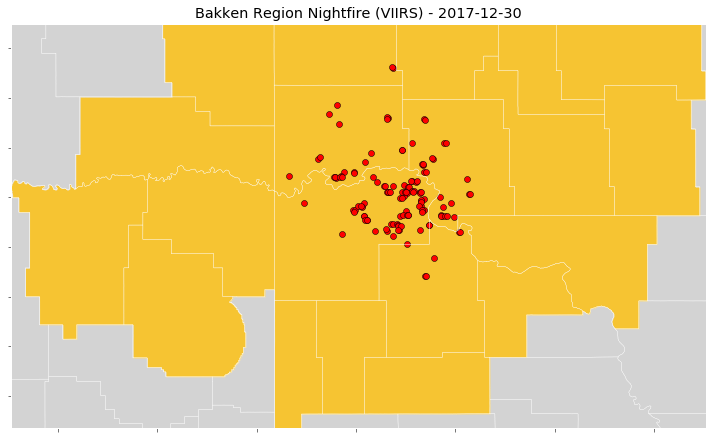

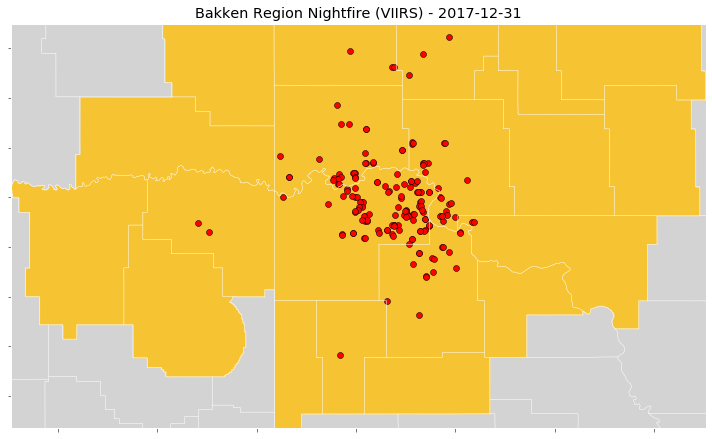

In [218]:
kwargs_write = {'fps':48, 'quantizer':'nq'}
imageio.mimsave(
    '../images/bakken_nightfire_2017.gif', 
    [plot_time_geo_df(dfig, basin_gdf, counties_gdf, i) for i in dfig.index.unique()], 
    fps=12,
)